# Working with MEG dataset
MEG dataset from THINGS initiative: https://openneuro.org/datasets/ds004212/versions/2.0.1
### Training data partition
The data is .fif file which needs to be converted into a rather easy to use .npy array.
We will use mne library for this: https://mne.tools/dev/index.html 


We collected extensively sampled object representations using magnetoencephalography (MEG). To this end, we drew on the THINGS database (Hebart et al., 2019), a richly-annotated database of 1,854 object concepts representative of the American English language which contains 26,107 manually-curated naturalistic object images.

ERP = event-related potential; signal with respect to some event
VEP = ERP for visual stimuli



27084 events, 281 time points, 271 channels

In [64]:
import numpy as np
import mne, os
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import matplotlib.image as mpimg
import nimfa

In [2]:
channel_picks               = ['O','T','P']
file_path = 'preprocessed/preprocessed_P1-epo.fif'
def load_epochs(file_path,all_epochs = []):
    epochs = mne.read_epochs(file_path, preload=False)
    return epochs
epochs = load_epochs(file_path)

Reading /home/asuryawanshi/Documents/THINGS/MEG/preprocessed/preprocessed_P1-epo.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/asuryawanshi/Documents/THINGS/MEG/preprocessed/preprocessed_P1-epo-1.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/asuryawanshi/Documents/THINGS/MEG/preprocessed/preprocessed_P1-epo-2.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/asuryawanshi/Documents/THINGS/MEG/preprocessed/preprocessed_P1-epo-3.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Adding metadata with 18 columns
27048 matching events found
No baseline correction applied
0 projection items activated


In [3]:
epochs.metadata

,trial_type,image_nr,category_nr,exemplar_nr,test_image_nr,things_category_nr,things_image_nr,things_exemplar_nr,image_path,onset,image_on,image_off,responded,key_id,key_time,RT,session_nr,run_nr
0,exp,21118,1760,10,NaN,1760.0,24812.0,10.0,images_meg/vest/vest_10s.jpg,3.00,3.005025,3.505181,0,NaN,NaN,NaN,1,1
1,exp,6922,577,10,NaN,577.0,8355.0,10.0,images_meg/fencepost/fencepost_10s.jpg,4.65,4.655683,5.155901,0,NaN,NaN,NaN,1,1
2,exp,7522,627,10,NaN,627.0,9054.0,10.0,images_meg/fondue/fondue_10s.jpg,6.00,6.206278,6.706482,0,NaN,NaN,NaN,1,1
3,exp,2950,246,10,NaN,246.0,3648.0,10.0,images_meg/camel/camel_10s.jpg,7.50,7.556825,8.056974,0,NaN,NaN,NaN,1,1
4,exp,18682,1557,10,NaN,1557.0,21998.0,10.0,images_meg/stingray/stingray_10s.jpg,9.00,9.074120,9.574357,0,NaN,NaN,NaN,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27043,exp,303,26,3,NaN,26.0,358.0,3.0,images_meg/anteater/anteater_03s.jpg,333.25,333.331516,333.831749,0,NaN,NaN,NaN,12,10
27044,exp,1671,140,3,NaN,140.0,2131.0,3.0,images_meg/blimp/blimp_03n.jpg,334.65,334.832104,335.332262,0,NaN,NaN,NaN,12,10
27045,exp,16083,1341,3,NaN,1341.0,19070.0,3.0,images_meg/rug/rug_03s.jpg,336.00,336.215922,336.716176,0,NaN,NaN,NaN,12,10
27046,exp,4731,395,3,NaN,395.0,5680.0,3.0,images_meg/computer/computer_03n.jpg,337.60,337.599834,338.100026,0,NaN,NaN,NaN,12,10


In [4]:
name = channel_picks[0]
print(name, channel_picks)
# ctf_layout = mne.find_layout(epochs.info)
picks_epochs = [epochs.ch_names[i] for i in np.where([s[2]==name for s in epochs.ch_names])[0]]
ep1 = epochs[epochs.metadata['trial_type']=='exp']  
ep1.load_data() 
ep1.pick_channels(ch_names=picks_epochs)

O ['O', 'T', 'P']
Loading data for 22248 events and 281 original time points ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


<EpochsFIF | 22248 events (all good), -0.1 – 1.3 s (baseline off), ~1.82 GB, data loaded, with metadata,
 '341': 1
 '483': 1
 '805': 1
 '1014': 1
 '1042': 1
 '1329': 1
 '1704': 1
 '1807': 1
 '1835': 1
 '2003': 1
 and 22238 more events ...>

In [30]:
NOS_CONCEPTS = 1854
NOS_IMAGE_PER_CONCEPT = 12
NOS_CHANNELS_OPT = 39
NOS_TIME_POINTS = 281
time_points = epochs.times 

In [21]:
ep1[(ep1.metadata['category_nr']==s+1)]._data.shape

(12, 39, 281)

In [23]:
concept_epochs = np.zeros((NOS_IMAGE_PER_CONCEPT, NOS_CONCEPTS, NOS_TIME_POINTS, NOS_CHANNELS_OPT))
for s in tqdm(range(1854)):
    concept_epochs[:,s,:,:] = ep1[(ep1.metadata['category_nr']==s+1)]._data.transpose(0, 2, 1)  

100%|██████████| 1854/1854 [25:01<00:00,  1.24it/s]


In [27]:
average_concept_epochs = concept_epochs.mean(axis = 0)
average_concept_epochs.shape

(1854, 281, 39)

In [61]:
z_scored_epochs = np.zeros_like(average_concept_epochs)
for channel in range(NOS_CHANNELS_OPT):
    mean = average_concept_epochs[:,channel,:].mean()
    stdev = average_concept_epochs[:,channel,:].std()
    z_scored_epochs[:,channel,:] = (average_concept_epochs[:,channel,:] - mean) / stdev
    z_scored_epochs[:,channel,:] += abs(z_scored_epochs[:,channel,:].min()) # make all values positive  

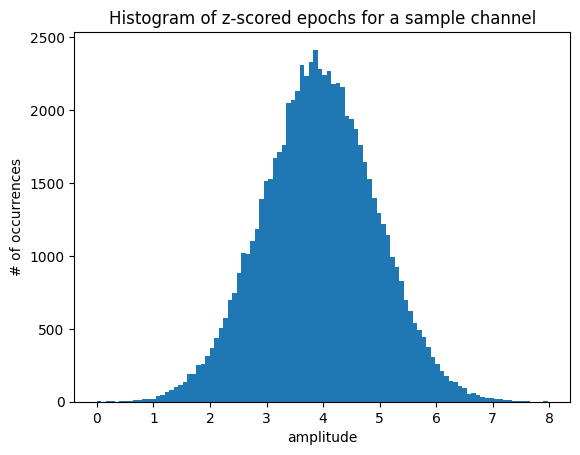

(1854, 281, 39)

In [69]:

plt.hist(z_scored_epochs[:,2,:].flatten(), bins=100)
plt.title('Histogram of z-scored epochs for a sample channel')
plt.xlabel('amplitude')
plt.ylabel('# of occurrences') 
plt.show()
z_scored_epochs.shape 

In [70]:
X = z_scored_epochs.reshape(NOS_CONCEPTS, NOS_TIME_POINTS*NOS_CHANNELS_OPT)

In [71]:
def fit_bnmf(V: np.ndarray, k: int):
    bnmf = nimfa.Bd(V, seed='random_c', rank=k, max_iter=500, min_residuals=1e-4, alpha=np.zeros((V.shape[0], k)),
                        beta=np.zeros((k, V.shape[1])), theta=.0, k=.0, sigma=1., skip=100, stride=1,
                        n_w=np.zeros((k, 1)), n_h=np.zeros((k, 1)), n_run=1, n_sigma=False)
    bnmf_fit = bnmf()
    W = bnmf_fit.basis()
    H = bnmf_fit.coef()
    return np.array(W), np.array(H)

def compute_evar_all(V: np.ndarray, W: np.ndarray, H: np.ndarray):
    V_hat = np.dot(W, H)
    rss = np.sum(np.asarray(V_hat - V)**2)
    evar_all = 1. - rss / (V*V).sum()
    return evar_all

def compute_evar_indiv(V: np.ndarray, W: np.ndarray, H: np.ndarray, d: int):
    V_hat_d = np.outer(W[:, d], H[d, :])
    rss = np.sum(np.asarray(V_hat_d - V)**2)
    evar_indiv = 1. - rss / (V*V).sum()
    return evar_indiv

def compute_evar_unique(V: np.ndarray, W: np.ndarray, H: np.ndarray, d: int, evar_all: float):
    V_hat_wo_d = np.dot(W[:, np.arange(W.shape[1]) != d], H[np.arange(H.shape[0]) != d, :])
    rss = np.sum(np.asarray(V_hat_wo_d - V)**2)
    evar_rest = 1. - rss / (V*V).sum()
    evar_unique = evar_all - evar_rest
    return evar_unique

In [72]:
nmf_components = 10 # 3 mins for 30 components 
BAYESIAN = 1

# Directory to save/load the matrices
directory = 'NMF_matrices'

# Check if W, H exists in folder and load them
if os.path.isfile(f'{directory}/W_{nmf_components}.npy') and os.path.isfile(f'{directory}/H_{nmf_components}.npy'):
    W = np.load(f'{directory}/W_{nmf_components}.npy')
    H = np.load(f'{directory}/H_{nmf_components}.npy')
else:
    if BAYESIAN:
        W, H = fit_bnmf(X, nmf_components)
        X_pred = np.dot(W, H)
    else:
        model = NMF(n_components=nmf_components)
        W = model.fit_transform(X)
        H = model.components_
        X_pred = np.dot(W, H)
    np.save(f'{directory}/W_{nmf_components}.npy', W)
    np.save(f'{directory}/H_{nmf_components}.npy', H)


In [100]:
epochs.metadata

,trial_type,image_nr,category_nr,exemplar_nr,test_image_nr,things_category_nr,things_image_nr,things_exemplar_nr,image_path,onset,image_on,image_off,responded,key_id,key_time,RT,session_nr,run_nr
0,exp,21118,1760,10,NaN,1760.0,24812.0,10.0,images_meg/vest/vest_10s.jpg,3.00,3.005025,3.505181,0,NaN,NaN,NaN,1,1
1,exp,6922,577,10,NaN,577.0,8355.0,10.0,images_meg/fencepost/fencepost_10s.jpg,4.65,4.655683,5.155901,0,NaN,NaN,NaN,1,1
2,exp,7522,627,10,NaN,627.0,9054.0,10.0,images_meg/fondue/fondue_10s.jpg,6.00,6.206278,6.706482,0,NaN,NaN,NaN,1,1
3,exp,2950,246,10,NaN,246.0,3648.0,10.0,images_meg/camel/camel_10s.jpg,7.50,7.556825,8.056974,0,NaN,NaN,NaN,1,1
4,exp,18682,1557,10,NaN,1557.0,21998.0,10.0,images_meg/stingray/stingray_10s.jpg,9.00,9.074120,9.574357,0,NaN,NaN,NaN,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27043,exp,303,26,3,NaN,26.0,358.0,3.0,images_meg/anteater/anteater_03s.jpg,333.25,333.331516,333.831749,0,NaN,NaN,NaN,12,10
27044,exp,1671,140,3,NaN,140.0,2131.0,3.0,images_meg/blimp/blimp_03n.jpg,334.65,334.832104,335.332262,0,NaN,NaN,NaN,12,10
27045,exp,16083,1341,3,NaN,1341.0,19070.0,3.0,images_meg/rug/rug_03s.jpg,336.00,336.215922,336.716176,0,NaN,NaN,NaN,12,10
27046,exp,4731,395,3,NaN,395.0,5680.0,3.0,images_meg/computer/computer_03n.jpg,337.60,337.599834,338.100026,0,NaN,NaN,NaN,12,10


In [82]:
nmf_components_vs_category = np.zeros((nmf_components, 5))
for i in range(nmf_components):
    print(f"Image category which loads best on component {i} is {np.argsort(W[:,i])[-5:]}")
    nmf_components_vs_category[i] = np.argsort(W[:,i])[-5:]

Image category which loads best on component 0 is [1341  382 1764 1584 1498]
Image category which loads best on component 1 is [ 890 1758 1597 1672  720]
Image category which loads best on component 2 is [ 830  284 1744  627 1669]
Image category which loads best on component 3 is [1372 1608 1293  528  764]
Image category which loads best on component 4 is [134 579 831 851  21]
Image category which loads best on component 5 is [ 738  454 1823 1698  784]
Image category which loads best on component 6 is [333 697 467 504 851]
Image category which loads best on component 7 is [1169  422  619  797  250]
Image category which loads best on component 8 is [1816  325 1253 1772  659]
Image category which loads best on component 9 is [ 523 1567 1206 1435  709]


In [126]:
for component in range(nmf_components):
    print(f"Component {component} is best loaded by the following image categories:")
    for i in range(5):
        category_nr = nmf_components_vs_category[component, i] 
        # Get the image paths for the given category_nr

        image_paths = epochs.metadata[(epochs.metadata['category_nr'] == category_nr) & (epochs.metadata['trial_type'] == 'exp')]['image_path']
        image_path = image_paths.iloc[0].split('/')[-2]
        print(f"Category {category_nr} - {image_path}")
    print('\n') 

Component 0 is best loaded by the following image categories:
Category 1341.0 - rug
Category 382.0 - coffee_table
Category 1764.0 - viewfinder
Category 1584.0 - sundial
Category 1498.0 - sorbet


Component 1 is best loaded by the following image categories:
Category 890.0 - lamb
Category 1758.0 - vending_machine
Category 1597.0 - swimming_pool
Category 1672.0 - toilet_paper
Category 720.0 - guacamole


Component 2 is best loaded by the following image categories:
Category 830.0 - ink
Category 284.0 - cassette
Category 1744.0 - umbrella
Category 627.0 - fondue
Category 1669.0 - toe


Component 3 is best loaded by the following image categories:
Category 1372.0 - scale
Category 1608.0 - tab
Category 1293.0 - ready_meal
Category 528.0 - duct
Category 764.0 - headdress


Component 4 is best loaded by the following image categories:
Category 134.0 - biscuit
Category 579.0 - ferret
Category 831.0 - inkwell
Category 851.0 - jewelry
Category 21.0 - amplifier


Component 5 is best loaded by the

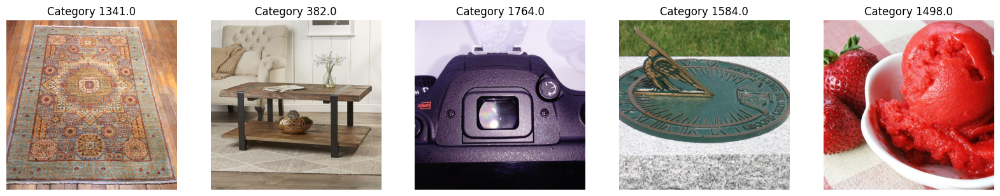

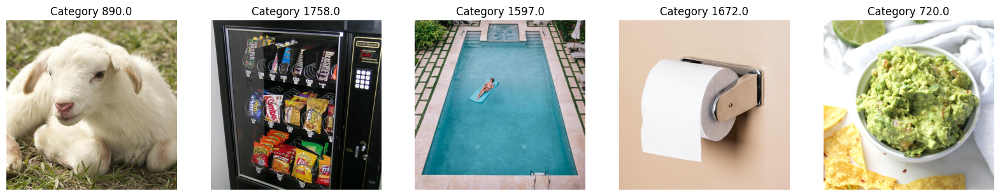

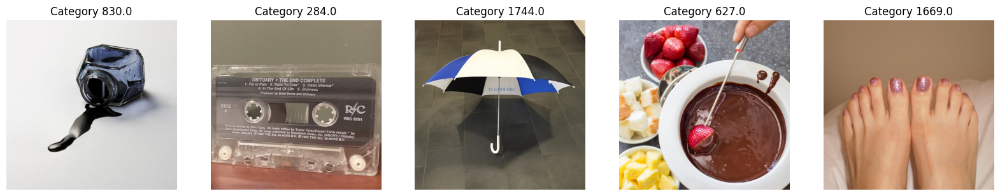

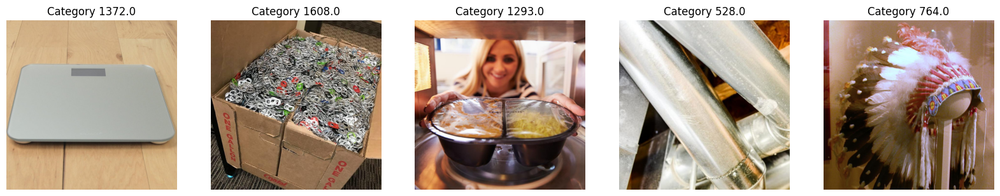

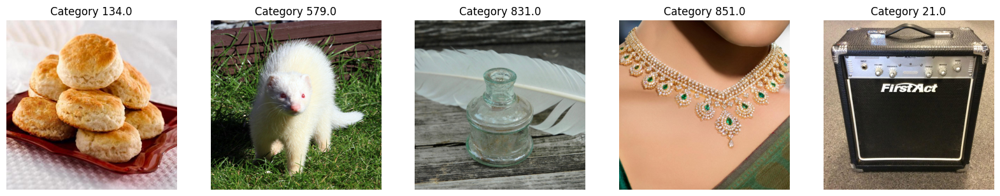

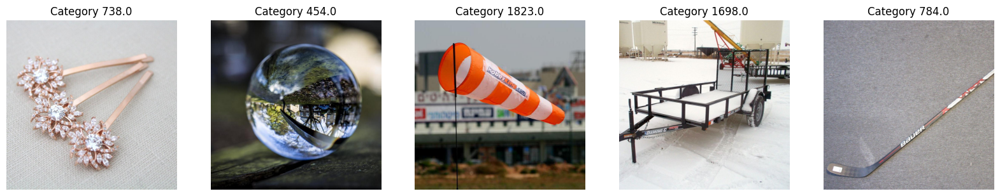

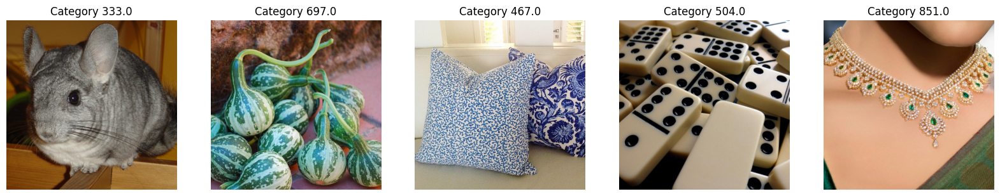

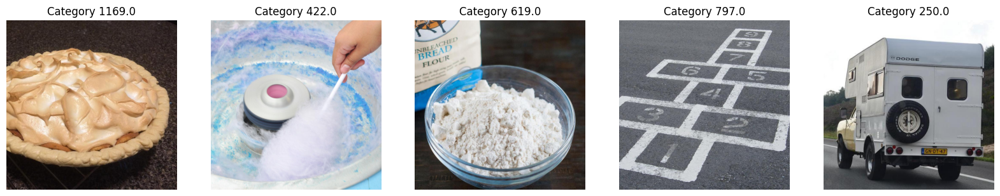

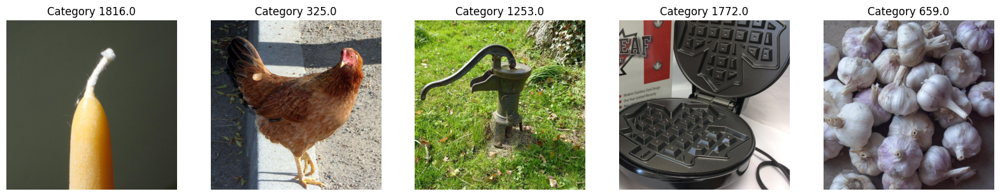

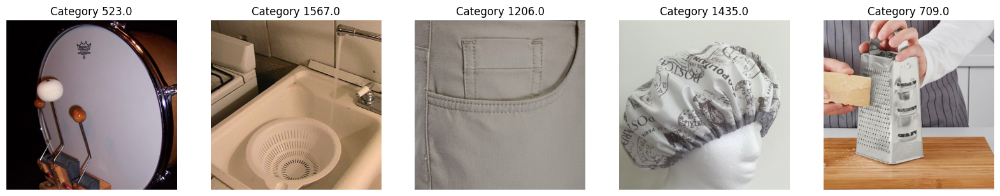

In [129]:
# plot images for the top 5 categories for each component   
for component in range(nmf_components):
    fig, axs = plt.subplots(1, 5, figsize=(20, 20))
    for i in range(5):
        category_nr = nmf_components_vs_category[component, i] 
        # Get the image paths for the given category_nr
        image_paths = epochs.metadata[(epochs.metadata['category_nr'] == category_nr) & (epochs.metadata['trial_type'] == 'exp')]['image_path']
        image_path = image_paths.iloc[0]
        img = mpimg.imread(image_path)
        axs[i].imshow(img)
        axs[i].set_title(f"Category {category_nr}")
        axs[i].axis('off')
    plt.show()